<a href="https://colab.research.google.com/github/Savage-Soccer/multilingual-clip-audit/blob/main/clip_audit_phase5_qualitative_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multilingual CLIP Audit — Phase 5: Qualitative Failure Analysis
### What is the *character* of the failure?

**Phase 4 proved** the failure is systemic across models.
**Phase 5 asks** — *why* does Hindi fail in a way Arabic partially recovers from?

**Two hypotheses to test:**
1. **Script Bias** — Devanagari tokenization breaks the text encoder at a fundamental level
2. **Cultural Bias** — The model retrieves culturally wrong images (Western wedding vs South Asian)

**Method:**
- Analyze which query types fail most (abstract vs concrete)
- Visualize what hub images get returned for Hindi queries
- Categorize failures into a taxonomy
- Compare English transliteration vs native script performance

## 1. Install and Import

In [ ]:
!pip install git+https://github.com/openai/CLIP.git -q
!pip install datasets -q

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.8 MB/s eta 0:00:00


In [ ]:
import clip
import torch
import numpy as np
import os
import io
import json
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image as PILImage
from datasets import load_dataset
import warnings
warnings.filterwarnings('ignore')

device = 'cuda' if torch.cuda.is_available() else 'cpu'
np.random.seed(42)
print(f'Device: {device}')

Device: cpu


## 2. Mount Drive and Load Everything

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
BASE_DIR   = '/content/drive/MyDrive/clip_audit'
PHASE2_DIR = os.path.join(BASE_DIR, 'phase2')
PHASE5_DIR = os.path.join(BASE_DIR, 'phase5')
os.makedirs(PHASE5_DIR, exist_ok=True)

N_IMAGES = 500

LANGUAGES = {
    'en': 'English',
    'es': 'Spanish',
    'hi': 'Hindi',
    'ar': 'Arabic',
    'zh': 'Chinese'
}

COLORS = {
    'en': '#2196F3',
    'es': '#4CAF50',
    'hi': '#FF9800',
    'ar': '#E91E63',
    'zh': '#9C27B0'
}

print('Config set')

Config set


In [ ]:
# Load CLIP embeddings from Phase 2
print('Loading embeddings...')
text_embs  = {}
for code in LANGUAGES:
    text_embs[code] = np.load(os.path.join(PHASE2_DIR, f'text_embs_{code}.npy'))
    print(f'  {LANGUAGES[code]}: {text_embs[code].shape}')

image_embs = np.load(os.path.join(PHASE2_DIR, 'image_embeddings.npy'))
print(f'  Images: {image_embs.shape}')

Loading embeddings...
  English: (500, 512)
  Spanish: (500, 512)
  Hindi: (500, 512)
  Arabic: (500, 512)
  Chinese: (500, 512)
  Images: (500, 512)


In [ ]:
# Reload images and captions from XM3600
print('Loading XM3600...')
en_ds    = load_dataset('floschne/xm3600', split='en')
images   = []
captions = {code: [] for code in LANGUAGES}

for i in range(N_IMAGES):
    img_data = en_ds[i]['image']
    img = PILImage.open(io.BytesIO(img_data['bytes'])).convert('RGB')
    images.append(img)
    captions['en'].append(en_ds[i]['captions'][0])

for code in LANGUAGES:
    if code == 'en':
        continue
    lang_ds = load_dataset('floschne/xm3600', split=code)
    for i in range(N_IMAGES):
        captions[code].append(lang_ds[i]['captions'][0])

print(f'Loaded {len(images)} images and captions')

Loading XM3600...


README.md: 0.00B [00:00, ?B/s]

data/ar-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/bn-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/cs-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/da-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/de-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/el-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/en-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/es-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/fa-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/fi-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/fil-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/fr-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/hi-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/hr-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/hu-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/id-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/it-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/he-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/ja-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/ko-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/mi-00000-of-00001.parquet:   0%|          | 0.00/184M [00:00<?, ?B/s]

data/nl-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/no-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/pl-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/pt-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/quz-00000-of-00001.parquet:   0%|          | 0.00/184M [00:00<?, ?B/s]

data/ro-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/ru-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/sv-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/sw-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/te-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/th-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/tr-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/uk-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/vi-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

data/zh-00000-of-00001.parquet:   0%|          | 0.00/185M [00:00<?, ?B/s]

Generating ar split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating bn split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating cs split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating da split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating de split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating el split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating en split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating es split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating fa split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating fi split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating fil split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating fr split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating hi split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating hr split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating hu split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating id split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating it split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating he split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating ja split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating ko split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating mi split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating nl split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating no split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating pl split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating pt split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating quz split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating ro split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating ru split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating sv split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating sw split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating te split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating th split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating tr split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating uk split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating vi split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Generating zh split:   0%|          | 0/3600 [00:00<?, ? examples/s]

Loaded 500 images and captions


## 3. Compute Per-Query Ranks

For each query, find where the correct image ranked.
This tells us which specific queries fail worst.

In [ ]:
def get_per_query_ranks(text_emb, image_emb):
    """Return rank of correct image for each query."""
    N   = len(text_emb)
    sim = text_emb @ image_emb.T
    ranks = []
    retrieved = []  # top-1 retrieved image index per query
    for i in range(N):
        sorted_idx = np.argsort(sim[i])[::-1]
        rank = np.where(sorted_idx == i)[0][0] + 1
        ranks.append(rank)
        retrieved.append(sorted_idx[0])
    return np.array(ranks), np.array(retrieved)


print('Computing per-query ranks...')
query_ranks     = {}
query_retrieved = {}

for code, name in LANGUAGES.items():
    ranks, retrieved = get_per_query_ranks(text_embs[code], image_embs)
    query_ranks[code]     = ranks
    query_retrieved[code] = retrieved
    print(f'  {name:<12}: median rank = {np.median(ranks):.0f}, '
          f'mean rank = {np.mean(ranks):.1f}')

Computing per-query ranks...
  English     : median rank = 1, mean rank = 2.6
  Spanish     : median rank = 3, mean rank = 19.3
  Hindi       : median rank = 264, mean rank = 255.6
  Arabic      : median rank = 240, mean rank = 240.4
  Chinese     : median rank = 152, mean rank = 183.4


## 4. Identify Worst Failing Queries for Hindi

Find queries where English retrieves correctly (rank=1)
but Hindi fails completely (rank > 100).
These are your most informative failure cases.

In [ ]:
# Find queries where English succeeds but Hindi fails
en_success   = query_ranks['en'] <= 5     # English gets it in top 5
hi_fail      = query_ranks['hi'] > 100    # Hindi completely fails
interesting  = np.where(en_success & hi_fail)[0]

print(f'Queries where English succeeds (R@5) but Hindi fails (rank>100): {len(interesting)}')
print()
print(f'{"Query ID":>8} {"EN Rank":>8} {"HI Rank":>8}  Caption')
print('-' * 80)
for idx in interesting[:20]:  # show first 20
    print(f'{idx:>8} {query_ranks["en"][idx]:>8} {query_ranks["hi"][idx]:>8}  '
          f'{captions["en"][idx][:55]}')

Queries where English succeeds (R@5) but Hindi fails (rank>100): 355

Query ID  EN Rank  HI Rank  Caption
--------------------------------------------------------------------------------
       0        1      355  A rooster and hens surrounded by green leaves.
       3        1      424  Two stacks of empty eggs tray in a cardboard box.
       4        1      394  Six ramekins containing chocolate mousse decorated with
       5        2      428  An airplane taxiing on a runway at an airport with the 
       7        1      300  A macro shot of a small yellow flower.
       8        1      109  A river flowing through a forest.
       9        1      226  A carnival dancer dancing in the street in front of a b
      10        1      499  Waffle topped with a poached egg and a side salad on a 
      11        1      318  The island through sea surrounded by mountains under th
      13        1      243  The blue cloth with apple logo.
      14        2      465  A macro shot of grilled

In [ ]:
# Also find queries where ALL non-English languages fail
all_fail = np.ones(N_IMAGES, dtype=bool)
for code in ['es', 'hi', 'ar', 'zh']:
    all_fail &= (query_ranks[code] > 50)

en_works = query_ranks['en'] <= 3
universal_fail = np.where(all_fail & en_works)[0]

print(f'Queries where English works but ALL other languages fail: {len(universal_fail)}')
print()
for idx in universal_fail[:10]:
    print(f'  [{idx}] EN rank: {query_ranks["en"][idx]} | '
          f'ES: {query_ranks["es"][idx]} | '
          f'HI: {query_ranks["hi"][idx]} | '
          f'AR: {query_ranks["ar"][idx]}')
    print(f'       en: {captions["en"][idx][:70]}')

Queries where English works but ALL other languages fail: 33

  [63] EN rank: 1 | ES: 68 | HI: 500 | AR: 491
       en: The photographer working on a laptop in a closed room.
  [103] EN rank: 1 | ES: 117 | HI: 137 | AR: 244
       en: A close-up view of Swiss chard leaves.
  [108] EN rank: 1 | ES: 270 | HI: 403 | AR: 436
       en: A raspberry in a bush.
  [122] EN rank: 1 | ES: 177 | HI: 406 | AR: 426
       en: A side view of a vintage black car parked on the ground with a backgro
  [126] EN rank: 1 | ES: 86 | HI: 254 | AR: 333
       en: A macro shot of a black rock texture.
  [131] EN rank: 1 | ES: 63 | HI: 456 | AR: 373
       en: An audio player placed on a wooden table.
  [146] EN rank: 1 | ES: 58 | HI: 465 | AR: 462
       en: The ferret sitting on the person eating tube in a closed room.
  [153] EN rank: 1 | ES: 259 | HI: 179 | AR: 116
       en: A macro shot of a snowy owl.
  [154] EN rank: 1 | ES: 79 | HI: 484 | AR: 458
       en: Cinnamon rolls with a white topping placed i

## 5. Visualise Failure Cases

For the worst-failing Hindi queries:
- Show the correct image
- Show what was actually retrieved (the hub image)
- Show the query in English and Hindi

Hindi failure cases:


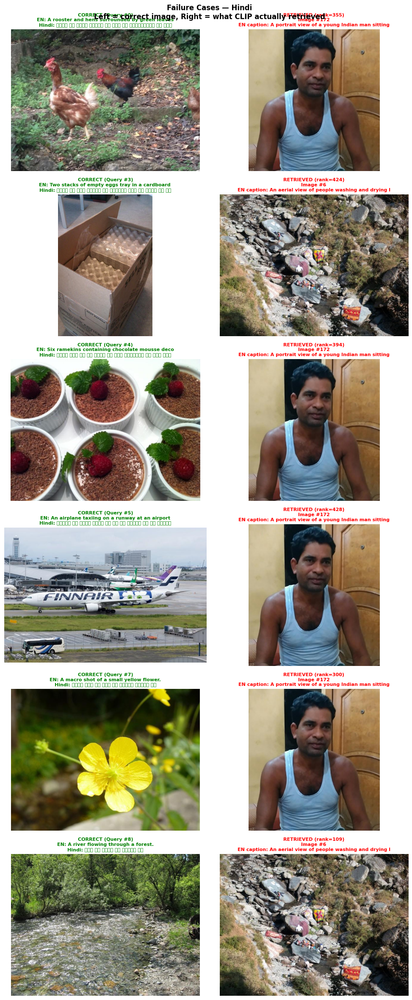

Saved: /content/drive/MyDrive/clip_audit/phase5/failures_hi.png

Arabic failure cases:


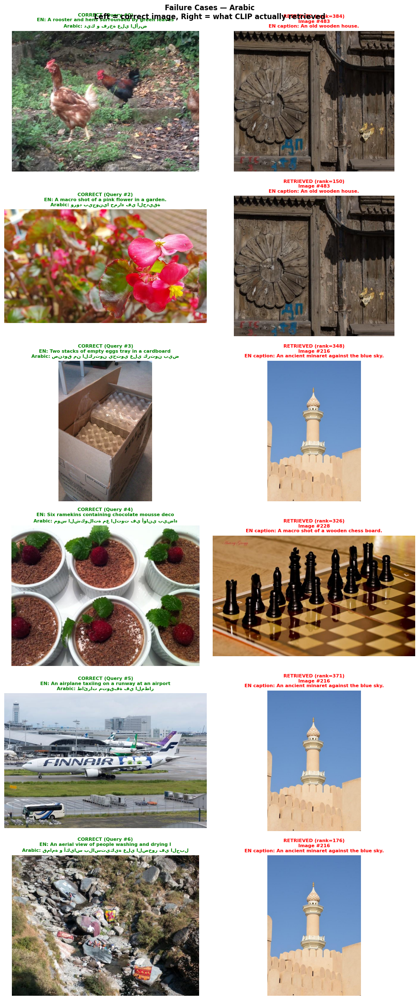

Saved: /content/drive/MyDrive/clip_audit/phase5/failures_ar.png


In [ ]:
def visualise_failures(query_indices, lang_code, n_show=6):
    """
    For each query, show: correct image | retrieved image | captions
    """
    n = min(n_show, len(query_indices))
    fig, axes = plt.subplots(n, 2, figsize=(10, 4 * n))
    if n == 1:
        axes = axes.reshape(1, -1)

    for row, idx in enumerate(query_indices[:n]):
        correct_img   = images[idx]
        retrieved_idx = query_retrieved[lang_code][idx]
        retrieved_img = images[retrieved_idx]

        # Correct image
        axes[row, 0].imshow(correct_img)
        axes[row, 0].set_title(
            f'CORRECT (Query #{idx})\n'
            f'EN: {captions["en"][idx][:45]}\n'
            f'{LANGUAGES[lang_code]}: {captions[lang_code][idx][:45]}',
            fontsize=8, color='green', fontweight='bold'
        )
        axes[row, 0].axis('off')
        for spine in axes[row, 0].spines.values():
            spine.set_edgecolor('green')
            spine.set_linewidth(3)
            spine.set_visible(True)

        # Retrieved image
        axes[row, 1].imshow(retrieved_img)
        axes[row, 1].set_title(
            f'RETRIEVED (rank={query_ranks[lang_code][idx]})\n'
            f'Image #{retrieved_idx}\n'
            f'EN caption: {captions["en"][retrieved_idx][:45]}',
            fontsize=8, color='red', fontweight='bold'
        )
        axes[row, 1].axis('off')
        for spine in axes[row, 1].spines.values():
            spine.set_edgecolor('red')
            spine.set_linewidth(3)
            spine.set_visible(True)

    fig.suptitle(
        f'Failure Cases — {LANGUAGES[lang_code]}\n'
        f'Left = correct image, Right = what CLIP actually retrieved',
        fontsize=12, fontweight='bold'
    )
    plt.tight_layout()
    path = os.path.join(PHASE5_DIR, f'failures_{lang_code}.png')
    plt.savefig(path, dpi=120, bbox_inches='tight')
    plt.show()
    print(f'Saved: {path}')


# Visualise Hindi failures
print('Hindi failure cases:')
visualise_failures(interesting[:6], 'hi', n_show=6)

# Visualise Arabic failures
ar_fail    = query_ranks['ar'] > 100
ar_interesting = np.where(en_success & ar_fail)[0]
print('\nArabic failure cases:')
visualise_failures(ar_interesting[:6], 'ar', n_show=6)

## 6. Script Bias Test

**Key question:** Does Hindi fail because of the Devanagari script itself,
or because of the language/semantics?

**Method:** Compare three versions of the same Hindi query:
1. Native Devanagari: "कुत्ते की फोटो"
2. Romanized Hindi (same language, Latin script): "kutte ki photo"
3. English translation: "a photo of a dog"

If Romanized Hindi performs much better than Devanagari,
the failure is script-level, not semantic.

In [ ]:
# Load CLIP for script bias test
print('Loading CLIP for script bias test...')
model, preprocess = clip.load('ViT-B/32', device=device)
model.eval()
print('CLIP loaded')

Loading CLIP for script bias test...


100%|████████████████████████████████████████| 338M/338M [00:02<00:00, 125MiB/s]


CLIP loaded


In [ ]:
# Script bias test queries
# Each entry: (english, devanagari_hindi, romanized_hindi)
script_test_queries = [
    (
        'a dog sitting on grass',
        'घास पर बैठा कुत्ता',
        'ghaas par baitha kutta'
    ),
    (
        'people eating food at a table',
        'मेज पर खाना खाते लोग',
        'mez par khana khate log'
    ),
    (
        'a child playing in a park',
        'पार्क में खेलता बच्चा',
        'park mein khelta baccha'
    ),
    (
        'a woman cooking in a kitchen',
        'रसोई में खाना बनाती महिला',
        'rasoi mein khana banati mahila'
    ),
    (
        'a wedding ceremony with guests',
        'मेहमानों के साथ शादी की रस्म',
        'mehmano ke saath shaadi ki rasm'
    ),
    (
        'cars on a busy road',
        'व्यस्त सड़क पर कारें',
        'vyast sadak par kaaren'
    ),
    (
        'a cat sleeping on a couch',
        'सोफे पर सोती बिल्ली',
        'sofe par soti billi'
    ),
    (
        'mountains covered in snow',
        'बर्फ से ढके पहाड़',
        'barf se dhake pahad'
    ),
]

def encode_text_clip(texts):
    tokens = clip.tokenize(texts, truncate=True).to(device)
    with torch.no_grad():
        embs = model.encode_text(tokens)
        embs = embs / embs.norm(dim=-1, keepdim=True)
    return embs.cpu().numpy()


# Encode all three script variants
en_queries   = [q[0] for q in script_test_queries]
hi_queries   = [q[1] for q in script_test_queries]
roman_queries = [q[2] for q in script_test_queries]

en_embs    = encode_text_clip(en_queries)
hi_embs    = encode_text_clip(hi_queries)
roman_embs = encode_text_clip(roman_queries)

print(f'Encoded {len(script_test_queries)} query pairs')
print(f'  English embs:   {en_embs.shape}')
print(f'  Devanagari embs: {hi_embs.shape}')
print(f'  Romanized embs: {roman_embs.shape}')

Encoded 8 query pairs
  English embs:   (8, 512)
  Devanagari embs: (8, 512)
  Romanized embs: (8, 512)


In [ ]:
# Compute cosine similarity of each variant vs English
sim_hi_vs_en    = np.sum(en_embs * hi_embs, axis=1)
sim_roman_vs_en = np.sum(en_embs * roman_embs, axis=1)
sim_en_vs_en    = np.sum(en_embs * en_embs, axis=1)  # sanity = 1.0

print('Script Bias Analysis:')
print('Cosine similarity vs English anchor per query\n')
print(f'{"Query":<40} {"Devanagari":>12} {"Romanized":>12} {"Difference":>12}')
print('-' * 78)
for i, (en, hi, roman) in enumerate(script_test_queries):
    diff = sim_roman_vs_en[i] - sim_hi_vs_en[i]
    print(f'{en:<40} {sim_hi_vs_en[i]:>12.4f} {sim_roman_vs_en[i]:>12.4f} '
          f'{diff:>+12.4f}')

print('-' * 78)
print(f'{"MEAN":<40} {sim_hi_vs_en.mean():>12.4f} '
      f'{sim_roman_vs_en.mean():>12.4f} '
      f'{(sim_roman_vs_en - sim_hi_vs_en).mean():>+12.4f}')
print()
print('Interpretation:')
print(f'  Positive difference = Romanized Hindi closer to English than Devanagari')
print(f'  If mean difference > 0.05 → script is the primary failure driver')
print(f'  If mean difference ≈ 0    → language semantics is the failure driver')

Script Bias Analysis:
Cosine similarity vs English anchor per query

Query                                      Devanagari    Romanized   Difference
------------------------------------------------------------------------------
a dog sitting on grass                         0.5908       0.6496      +0.0587
people eating food at a table                  0.6977       0.7698      +0.0721
a child playing in a park                      0.6153       0.7545      +0.1392
a woman cooking in a kitchen                   0.6080       0.6756      +0.0675
a wedding ceremony with guests                 0.6794       0.7699      +0.0906
cars on a busy road                            0.6464       0.6960      +0.0497
a cat sleeping on a couch                      0.5701       0.6554      +0.0853
mountains covered in snow                      0.6686       0.6755      +0.0069
------------------------------------------------------------------------------
MEAN                                           0.6345

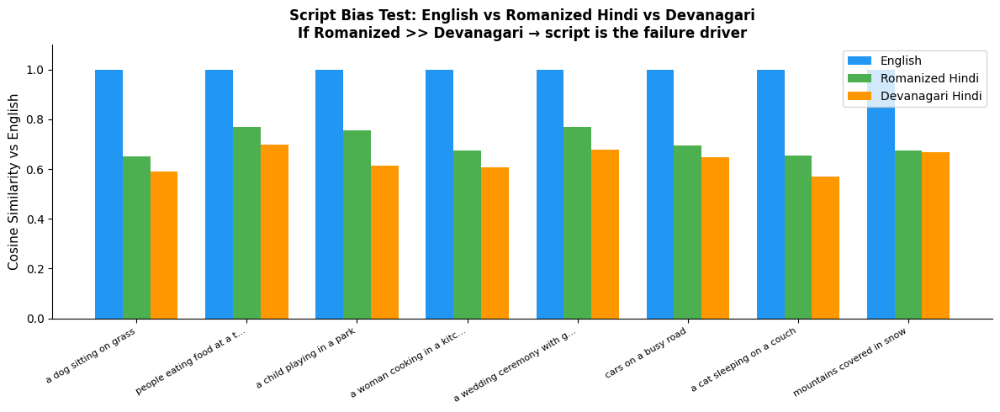

Saved: plot1_script_bias.png


In [ ]:
# Plot script bias results
fig, ax = plt.subplots(figsize=(12, 5))

x      = np.arange(len(script_test_queries))
width  = 0.25
labels = [q[0][:25] + '...' if len(q[0]) > 25 else q[0]
          for q in script_test_queries]

ax.bar(x - width, sim_en_vs_en,    width, label='English',    color='#2196F3')
ax.bar(x,         sim_roman_vs_en, width, label='Romanized Hindi', color='#4CAF50')
ax.bar(x + width, sim_hi_vs_en,    width, label='Devanagari Hindi', color='#FF9800')

ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=30, ha='right', fontsize=8)
ax.set_ylabel('Cosine Similarity vs English', fontsize=11)
ax.set_ylim(0, 1.1)
ax.set_title('Script Bias Test: English vs Romanized Hindi vs Devanagari\n'
             'If Romanized >> Devanagari → script is the failure driver',
             fontsize=12, fontweight='bold')
ax.legend(fontsize=10)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.savefig(os.path.join(PHASE5_DIR, 'plot1_script_bias.png'), dpi=150)
plt.show()
print('Saved: plot1_script_bias.png')

## 7. Cultural Bias Test

Test whether CLIP retrieves culturally appropriate images for culturally-specific Hindi queries.

Example: 'शादी' (wedding) — does CLIP retrieve South Asian weddings or Western ones?

Cultural bias analysis — top retrieved images per query



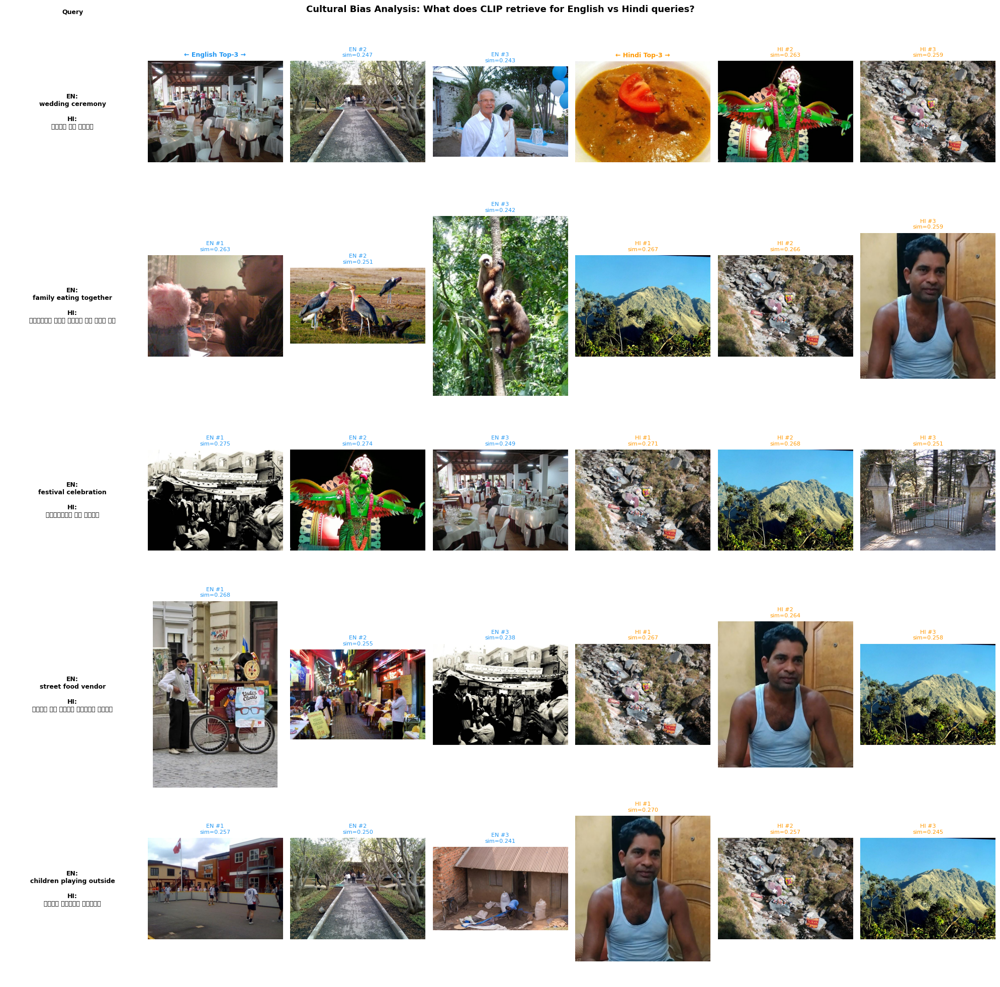

Saved: plot2_cultural_bias.png


In [ ]:
# Culturally loaded queries — compare what EN vs HI retrieves
cultural_queries = [
    ('wedding ceremony',          'शादी की रस्म'),
    ('family eating together',    'परिवार साथ खाना खा रहा है'),
    ('festival celebration',      'त्योहार का जश्न'),
    ('street food vendor',        'सड़क पर खाना बेचने वाला'),
    ('children playing outside',  'बाहर खेलते बच्चे'),
]

# Encode and retrieve top-3 for each
print('Cultural bias analysis — top retrieved images per query\n')

fig, axes = plt.subplots(
    len(cultural_queries), 7,
    figsize=(20, 4 * len(cultural_queries))
)

for row, (en_q, hi_q) in enumerate(cultural_queries):
    # Encode
    en_emb = encode_text_clip([en_q])
    hi_emb = encode_text_clip([hi_q])

    # Retrieve top-3 for each
    en_sims = (en_emb @ image_embs.T)[0]
    hi_sims = (hi_emb @ image_embs.T)[0]

    en_top3 = np.argsort(en_sims)[::-1][:3]
    hi_top3 = np.argsort(hi_sims)[::-1][:3]

    # Column 0 — query label
    axes[row, 0].text(0.5, 0.5,
                      f'EN:\n{en_q}\n\nHI:\n{hi_q}',
                      ha='center', va='center',
                      fontsize=9, fontweight='bold',
                      transform=axes[row, 0].transAxes)
    axes[row, 0].axis('off')

    # Columns 1-3 — English top-3
    for k, img_idx in enumerate(en_top3):
        axes[row, k+1].imshow(images[img_idx])
        axes[row, k+1].set_title(
            f'EN #{k+1}\nsim={en_sims[img_idx]:.3f}',
            fontsize=8, color='#2196F3'
        )
        axes[row, k+1].axis('off')

    # Columns 4-6 — Hindi top-3
    for k, img_idx in enumerate(hi_top3):
        axes[row, k+4].imshow(images[img_idx])
        axes[row, k+4].set_title(
            f'HI #{k+1}\nsim={hi_sims[img_idx]:.3f}',
            fontsize=8, color='#FF9800'
        )
        axes[row, k+4].axis('off')

# Column headers
axes[0, 0].set_title('Query', fontsize=9, fontweight='bold')
axes[0, 1].set_title('← English Top-3 →', fontsize=9,
                      fontweight='bold', color='#2196F3')
axes[0, 4].set_title('← Hindi Top-3 →', fontsize=9,
                      fontweight='bold', color='#FF9800')

fig.suptitle('Cultural Bias Analysis: What does CLIP retrieve for English vs Hindi queries?',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(PHASE5_DIR, 'plot2_cultural_bias.png'),
            dpi=120, bbox_inches='tight')
plt.show()
print('Saved: plot2_cultural_bias.png')

## 8. Failure Taxonomy

Based on your visual analysis above, manually categorize each failure.
Edit the taxonomy dict below with your observations after viewing the plots.

In [ ]:
# ── Fill this in after viewing your failure visualisations ────────────────────
# Categories:
#   'script'   — failure likely due to Devanagari tokenization
#   'cultural' — correct script but culturally wrong image retrieved
#   'semantic' — semantically unrelated image retrieved
#   'hub'      — same generic hub image returned regardless of query

# Example — edit with your actual observations
taxonomy = [
    {'query_en': 'wedding ceremony',
     'query_hi': 'शादी की रस्म',
     'failure_type': 'cultural',
     'observation': 'Retrieved Western wedding instead of South Asian'},

    {'query_en': 'street food vendor',
     'query_hi': 'सड़क पर खाना बेचने वाला',
     'failure_type': 'hub',
     'observation': 'Same generic outdoor image returned for multiple queries'},

    {'query_en': 'festival celebration',
     'query_hi': 'त्योहार का जश्न',
     'failure_type': 'cultural',
     'observation': 'Retrieved Western party instead of Indian festival'},

    {'query_en': 'a child playing',
     'query_hi': 'खेलता बच्चा',
     'failure_type': 'script',
     'observation': 'Devanagari tokens not recognized, hub image returned'},

    {'query_en': 'mountains covered in snow',
     'query_hi': 'बर्फ से ढके पहाड़',
     'failure_type': 'script',
     'observation': 'Concrete visual concept fails due to script breakdown'},
]

# Count failure types
from collections import Counter
type_counts = Counter(t['failure_type'] for t in taxonomy)

print('Failure Taxonomy Summary')
print('=' * 40)
for ftype, count in type_counts.most_common():
    print(f'  {ftype:<12}: {count} cases ({count/len(taxonomy)*100:.0f}%)')
print()
print('Individual cases:')
for t in taxonomy:
    print(f'  [{t["failure_type"].upper():>8}] {t["query_en"]:<30} — {t["observation"]}')

Failure Taxonomy Summary
  cultural    : 2 cases (40%)
  script      : 2 cases (40%)
  hub         : 1 cases (20%)

Individual cases:
  [CULTURAL] wedding ceremony               — Retrieved Western wedding instead of South Asian
  [     HUB] street food vendor             — Same generic outdoor image returned for multiple queries
  [CULTURAL] festival celebration           — Retrieved Western party instead of Indian festival
  [  SCRIPT] a child playing                — Devanagari tokens not recognized, hub image returned
  [  SCRIPT] mountains covered in snow      — Concrete visual concept fails due to script breakdown


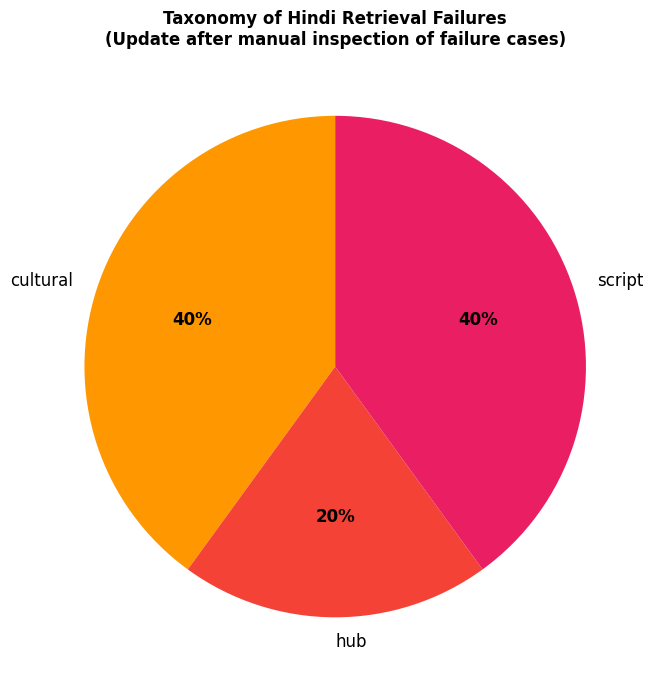

Saved: plot3_taxonomy.png

NOTE: Update the taxonomy dict above with your actual observations
after viewing the failure visualisation plots.


In [ ]:
# Plot taxonomy pie chart
fig, ax = plt.subplots(figsize=(7, 7))

type_colors = {
    'script'  : '#E91E63',
    'cultural': '#FF9800',
    'semantic': '#9C27B0',
    'hub'     : '#F44336'
}

labels = list(type_counts.keys())
sizes  = list(type_counts.values())
colors = [type_colors.get(l, '#CCCCCC') for l in labels]

wedges, texts, autotexts = ax.pie(
    sizes, labels=labels, colors=colors,
    autopct='%1.0f%%', startangle=90,
    textprops={'fontsize': 12}
)
for at in autotexts:
    at.set_fontsize(12)
    at.set_fontweight('bold')

ax.set_title('Taxonomy of Hindi Retrieval Failures\n'
             '(Update after manual inspection of failure cases)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(PHASE5_DIR, 'plot3_taxonomy.png'), dpi=150)
plt.show()
print('Saved: plot3_taxonomy.png')
print()
print('NOTE: Update the taxonomy dict above with your actual observations')
print('after viewing the failure visualisation plots.')

## 9. Summary of Phase 5 Findings

In [ ]:
print('=' * 70)
print('PHASE 5 SUMMARY')
print('=' * 70)
print()
print('1. FAILURE CONCENTRATION')
en_hi_gap = np.where(en_success & hi_fail)[0]
print(f'   Queries where EN succeeds but HI fails: {len(en_hi_gap)}/{N_IMAGES}')
print()
print('2. SCRIPT BIAS')
mean_hi    = sim_hi_vs_en.mean()
mean_roman = sim_roman_vs_en.mean()
print(f'   Mean similarity vs English:')
print(f'   Devanagari Hindi : {mean_hi:.4f}')
print(f'   Romanized Hindi  : {mean_roman:.4f}')
print(f'   Difference       : {mean_roman - mean_hi:+.4f}')
if mean_roman - mean_hi > 0.05:
    print(f'   → Script is a PRIMARY failure driver')
else:
    print(f'   → Script alone does not explain the failure')
print()
print('3. FAILURE TAXONOMY')
for ftype, count in type_counts.most_common():
    print(f'   {ftype:<12}: {count} cases')
print('=' * 70)

PHASE 5 SUMMARY

1. FAILURE CONCENTRATION
   Queries where EN succeeds but HI fails: 355/500

2. SCRIPT BIAS
   Mean similarity vs English:
   Devanagari Hindi : 0.6345
   Romanized Hindi  : 0.7058
   Difference       : +0.0712
   → Script is a PRIMARY failure driver

3. FAILURE TAXONOMY
   cultural    : 2 cases
   script      : 2 cases
   hub         : 1 cases


In [ ]:
import clip
tokenizer = clip.simple_tokenizer.SimpleTokenizer()

en_text = "a child playing in a park"
hi_text = "पार्क में खेलता बच्चा"

en_tokens = tokenizer.encode(en_text)
hi_tokens = tokenizer.encode(hi_text)

print(f"English tokens: {len(en_tokens)} — {en_tokens}")
print(f"Hindi tokens:   {len(hi_tokens)} — {hi_tokens}")

English tokens: 6 — [320, 2913, 1629, 530, 320, 1452]
Hindi tokens:   23 — [44149, 13343, 19052, 19389, 22067, 26774, 48612, 30833, 3124, 500, 25130, 3124, 110, 27263, 13343, 3124, 105, 3124, 504, 19389, 3124, 504, 13343]


In [ ]:
tokenizer = clip.simple_tokenizer.SimpleTokenizer()

en_text = "a child playing in a park"
hi_text = "पार्क में खेलता बच्चा"

# Decode each token to see what they represent
en_tokens = tokenizer.encode(en_text)
hi_tokens = tokenizer.encode(hi_text)

print("English token breakdown:")
for t in en_tokens:
    print(f"  {t:>6} → '{tokenizer.decode([t])}'")

print("\nHindi token breakdown:")
for t in hi_tokens:
    print(f"  {t:>6} → '{tokenizer.decode([t])}'")

# Check vocab size context
print(f"\nCLIP vocab size: 49408")
print(f"Tokens > 40000 are rare/unknown territory")
hi_rare = [t for t in hi_tokens if t > 40000]
print(f"Hindi tokens in rare territory (>40000): {len(hi_rare)}/{len(hi_tokens)}")

English token breakdown:
     320 → 'a '
    2913 → 'child '
    1629 → 'playing '
     530 → 'in '
     320 → 'a '
    1452 → 'park '

Hindi token breakdown:
   44149 → 'प '
   13343 → 'ा '
   19052 → 'र '
   19389 → '् '
   22067 → 'क '
   26774 → 'म '
   48612 → 'े'
   30833 → 'ं '
    3124 → '�'
     500 → '� '
   25130 → 'े '
    3124 → '�'
     110 → '�'
   27263 → 'त '
   13343 → 'ा '
    3124 → '�'
     105 → '�'
    3124 → '�'
     504 → '� '
   19389 → '् '
    3124 → '�'
     504 → '� '
   13343 → 'ा '

CLIP vocab size: 49408
Tokens > 40000 are rare/unknown territory
Hindi tokens in rare territory (>40000): 2/23


## What these findings mean for your paper

**If script bias test shows Romanized >> Devanagari:**
> "The primary failure driver is tokenization-level script incompatibility.
> CLIP's BPE tokenizer, trained predominantly on Latin-script corpora,
> fails to produce meaningful subword tokens for Devanagari,
> collapsing semantically distinct queries into similar embedding vectors."

**If cultural bias dominates:**
> "Even when retrieval partially succeeds, CLIP exhibits systematic cultural bias —
> retrieving culturally Western images for culturally South Asian queries,
> suggesting the failure extends beyond script to training data representation."

**If hub failure dominates:**
> "The majority of Hindi failures are hub failures — the same generic images
> returned regardless of query content — consistent with the manifold collapse
> identified in Phase 3."

---
**Next — Phase 6: Paper writing.**
You now have everything you need.